## A brief word on the dependencies:
#### The notebook runs under python=3.7
#### To make the tensorflow correctly utilize GPU, I had to take a few actions. Firstly, I installed the latest drivers for my GPU. Secondly, I installed the libraries in the following order:
tensorflow-gpu=2.1.0 <br>
cudatoolkit=10.1 <br>
cudnn=7.6 <br>
#### If you already have a tensorflow or tensorflow-gpu installed, do the following:
Remove both tensorflow and tensorflow-gpu before installing the abovementioned libraries.
#### If the error persists, do the following.
Remove both tensorflow and tensorflow-gpu. Install the latest tensorflow-gpu, cudatoolkit and cudnn. Then install tensorflow-gpu=2.1.0, which will reinstall the correct versions of cudatoolkit and cudnn.
#### No need to install cuda and cudnn from nvidia separately.
#### A few other libraries which are not installed automatically nor imported explicitly, but are needed to execute the notebook:
pydot <br>
pydotplus <br>
graphviz <br>

In [62]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
import os
import time
from matplotlib import pyplot as plt
from IPython import display

Num GPUs Available:  1


In [63]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3011639911610313696
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 11344216064
locality {
  bus_id: 1
  links {
  }
}
incarnation: 6491013774421497403
physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"
]


Currently the code requires to download the archive every time. Smart ideas are welcome.

In [64]:
_URL = 'https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz'

path_to_zip = tf.keras.utils.get_file('facades.tar.gz',
                                      origin=_URL,
                                      extract=True)

PATH = os.path.join(os.path.dirname(path_to_zip), 'facades/')

In [65]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [66]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  real_image = tf.cast(real_image, tf.float32)

  return real_image

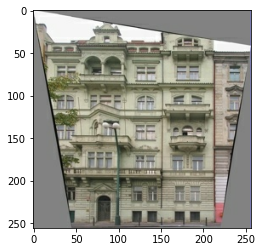

In [67]:
re = load(PATH+'train/100.jpg')
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(re/255.0)

In [68]:
def resize(real_image, height, width):
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return real_image

In [69]:
def random_crop(real_image):
  cropped_image = tf.image.random_crop(
      real_image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

In [70]:
# normalizing the images to [-1, 1]

def normalize(real_image):
  real_image = (real_image / 127.5) - 1

  return real_image

In [71]:
@tf.function()
def random_jitter(real_image):
  # resizing to 286 x 286 x 3
  real_image = resize(real_image, 286, 286)

  # randomly cropping to 256 x 256 x 3
  real_image = random_crop(real_image)

  if tf.random.uniform(()) > 0.5:
    # random mirroring
    real_image = tf.image.flip_left_right(real_image)

  return real_image

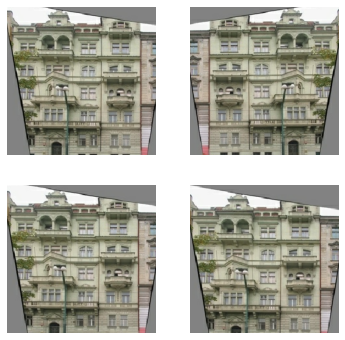

In [72]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_re = random_jitter(re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_re/255.0)
  plt.axis('off')
plt.show()

In [73]:
def load_image_train(image_file):
  real_image = load(image_file)
  real_image = random_jitter(real_image)
  real_image = normalize(real_image)

  return real_image

In [74]:
def load_image_test(image_file):
  real_image = load(image_file)
  real_image = resize(real_image, IMG_HEIGHT, IMG_WIDTH)
  real_image = normalize(real_image)

  return real_image

Autotune can not be simply run, because I guess it is a tensorflow version mismatch. Hence needs the reference.

In [75]:
train_dataset = tf.data.Dataset.list_files(PATH+'train/*.jpg')
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [76]:
test_dataset = tf.data.Dataset.list_files(PATH+'test/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [77]:
OUTPUT_CHANNELS = 3
INPUT_CHANNELS = 3

In [78]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [79]:
down_model = downsample(3, 4)
# We need the random noise somewhere here
down_result = down_model(tf.expand_dims(re, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [80]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [81]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [82]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    downsample(512, 4),  # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

The cell below might be throwing errors. In this case, need to additionally install:
pydot
pydotplus
graphviz

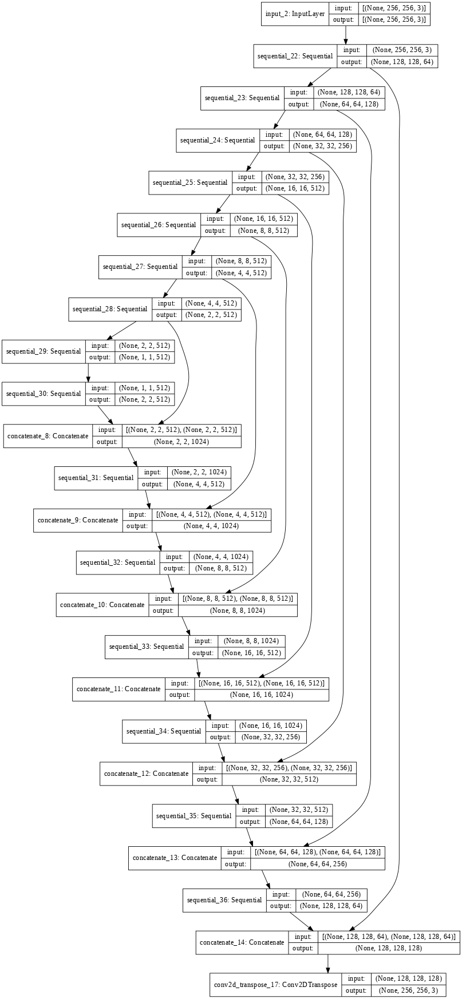

In [83]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [84]:
def random_noise(batch_size, img_width, img_height, input_channels):
    noise_vector = tf.random.normal([batch_size, img_width, img_height, input_channels]) * 16
    return noise_vector

In [85]:
z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT, INPUT_CHANNELS)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tf.Tensor(
[[[[ 0.14653464  0.06376836  0.04951895]
   [ 0.12168482  0.2802843  -0.15895241]
   [ 0.19092615  0.2487021  -0.09597021]
   ...
   [-0.2571832   0.11322337 -0.26147455]
   [-0.04549913 -0.41318792  0.15593752]
   [ 0.20935671 -0.30203444  0.16713005]]

  [[ 0.11123555 -0.42735422  0.08016866]
   [ 0.52808857  0.2617577   0.31184918]
   [-0.6574952  -0.27612936 -0.19022062]
   ...
   [ 0.7775586  -0.43957454  0.62128776]
   [ 0.51348174  0.817982    0.48501608]
   [ 0.23520626 -0.04348363  0.75856584]]

  [[ 0.1023346  -0.05888356  0.21007836]
   [ 0.24358894  0.10547148 -0.5908504 ]
   [-0.21552967  0.33301708 -0.05542751]
   ...
   [ 0.08693536 -0.70805854 -0.29660454]
   [ 0.17815067 -0.42238745  0.64157504]
   [ 0.33100536 -0.23305841  0.07196274]]

  ...

  [[-0.02659755  0.0885116  -0.3462531 ]
   [-0.11489585 -0.43687618  0.27913862]
   [ 0.1999585   0.25678834  0.16750813]
   ...
   [ 0.7650424  -0.01751318  0.0999417 ]
   [-0.1542621  -0.06745862 -0.07610722]
   [ 

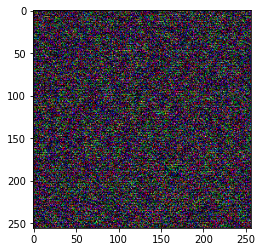

In [86]:
gen_output = generator(z, training=False)
plt.imshow(gen_output[0, ...])
print(gen_output)

In [87]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [88]:
# Removed Lambda and all related losses
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  return gan_loss

In [89]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  z = tf.keras.layers.Input(shape=[256, 256, 3], name='z_vector')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([z, tar])  # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[z, tar], outputs=last)

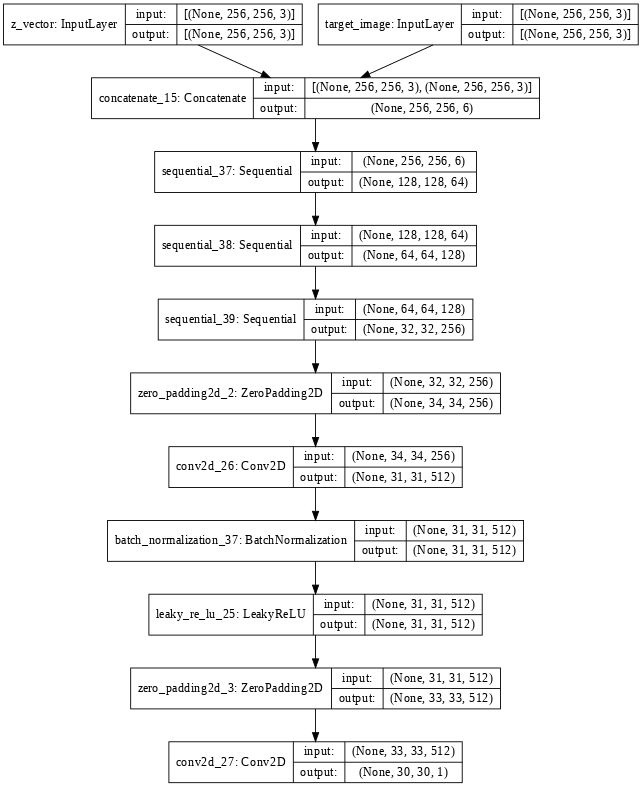

In [90]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

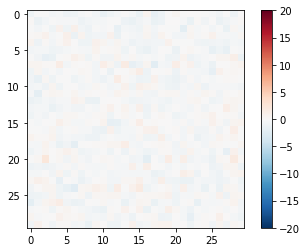

In [91]:
z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT, INPUT_CHANNELS)
zd = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT, INPUT_CHANNELS)
disc_out = discriminator([z, gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [92]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [93]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.4)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.4)

In [94]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [95]:
# Didn't change anything here, because not yet sure how the model function would look like
def generate_images(model, z, tar):
  prediction = model(z[tf.newaxis, ...], training=True)
  plt.figure(figsize=(15, 15))

  display_list = [z, tar[0], prediction[0]]
  title = ['Z Vector', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [96]:
zd

<tf.Tensor: shape=(1, 256, 256, 3), dtype=float32, numpy=
array([[[[-8.50059414e+00, -2.01444054e+00,  1.29249744e+01],
         [ 1.54755278e+01, -1.72456741e+01,  7.10658121e+00],
         [-1.18269444e+01, -3.30711136e+01, -4.07123947e+00],
         ...,
         [ 1.67446213e+01, -5.47393274e+00, -1.43862796e+00],
         [ 7.98746014e+00,  8.66709805e+00, -2.06359253e+01],
         [-1.06278248e+01,  1.94746399e+01, -4.28173304e+00]],

        [[ 9.89922523e+00,  1.06554675e+00,  1.22021055e+01],
         [-1.41053562e+01, -2.19795361e+01, -1.68018074e+01],
         [ 8.36243820e+00,  2.28216610e+01, -1.27909460e+01],
         ...,
         [-2.43726654e+01, -1.70159650e+00, -1.32994545e+00],
         [-5.85883856e+00,  8.21994591e+00,  9.81868088e-01],
         [ 1.29458847e+01, -2.29709034e+01,  2.82665901e+01]],

        [[ 5.03112650e+00,  8.10955715e+00,  3.15466213e+01],
         [-3.85727463e+01,  1.66161690e+01, -4.71233940e+00],
         [-1.64232178e+01, -1.89909160e+00

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


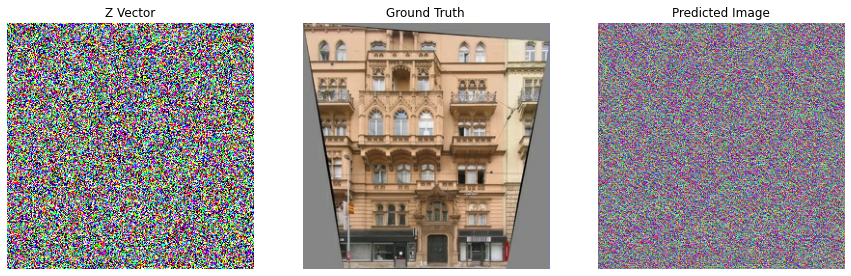

In [97]:
for example_target in test_dataset.take(1):
  generate_images(generator, z[0], example_target)

In [98]:
EPOCHS = 150

In [99]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [100]:
@tf.function
def train_step(z, zd, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(z, training=True)

    disc_real_output = discriminator([zd, target], training=True)
    disc_generated_output = discriminator([zd, gen_output], training=True)

    gen_gan_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_gan_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [101]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)
    z = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT, INPUT_CHANNELS)
    zd = random_noise(BATCH_SIZE, IMG_WIDTH, IMG_HEIGHT, INPUT_CHANNELS)
    for example_target in test_dataset.take(1):
        generate_images(generator, z[0], example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(z, zd, target, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

In [102]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [103]:
%tensorboard --logdir {log_dir} --host localhost --port 8088

<IPython.core.display.Javascript object>

taskkill /IM "tensorboard.exe" /F
Killing process in cmd

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


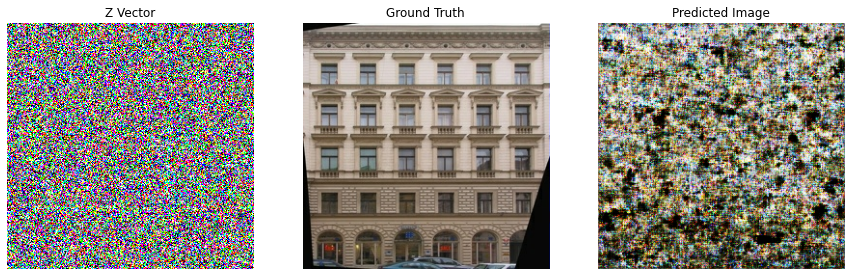

Epoch:  111
....................................................................................................
....................................................................................................
.............................................................

In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

In [ ]:
%ls {checkpoint_dir}

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [ ]:
print(tf.train.latest_checkpoint(checkpoint_dir))

Some observations
1) Some labels are overlapping, so the output may be mixing things up as a result.
2) Same labels may collect quite different features of the facade, so in those algorithm is also mixing things up. For instance ground level display windows also contain things like air conditioners.
3) The roof is not labelled.
4) In general, labelling is pretty inaccurate, as labels sometimes take more place on the image than the actual ground truth object. Also, sometimes labelling is vertically inconsistent for no reason.
5) Mirroring and jittering of the ground gruth images seems to be coped with well.
6) No-to-limited depth perception, which is kind of expected.

In [ ]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)